In [5]:
import os
import librosa
import IPython.display as ipd


import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN, AgglomerativeClustering, AffinityPropagation, KMeans
from sklearn.neighbors import NearestNeighbors
from sklearn.metrics import silhouette_score, davies_bouldin_score 
from sklearn.decomposition import PCA
from scipy.spatial.distance import cdist

In [6]:
# Directory containing audio files
audio_directory = r'C:\Users\alina\Desktop\Capstone Project\segmented_audio'
audio_files = [os.path.join(audio_directory, f) for f in os.listdir(audio_directory) if f.endswith('.wav')]

# Load the saved features
features_scaled = np.load('features_scaled.npy')
print("Loaded features with shape:", features_scaled.shape)

Loaded features with shape: (86335, 13)


<Figure size 1500x1500 with 0 Axes>

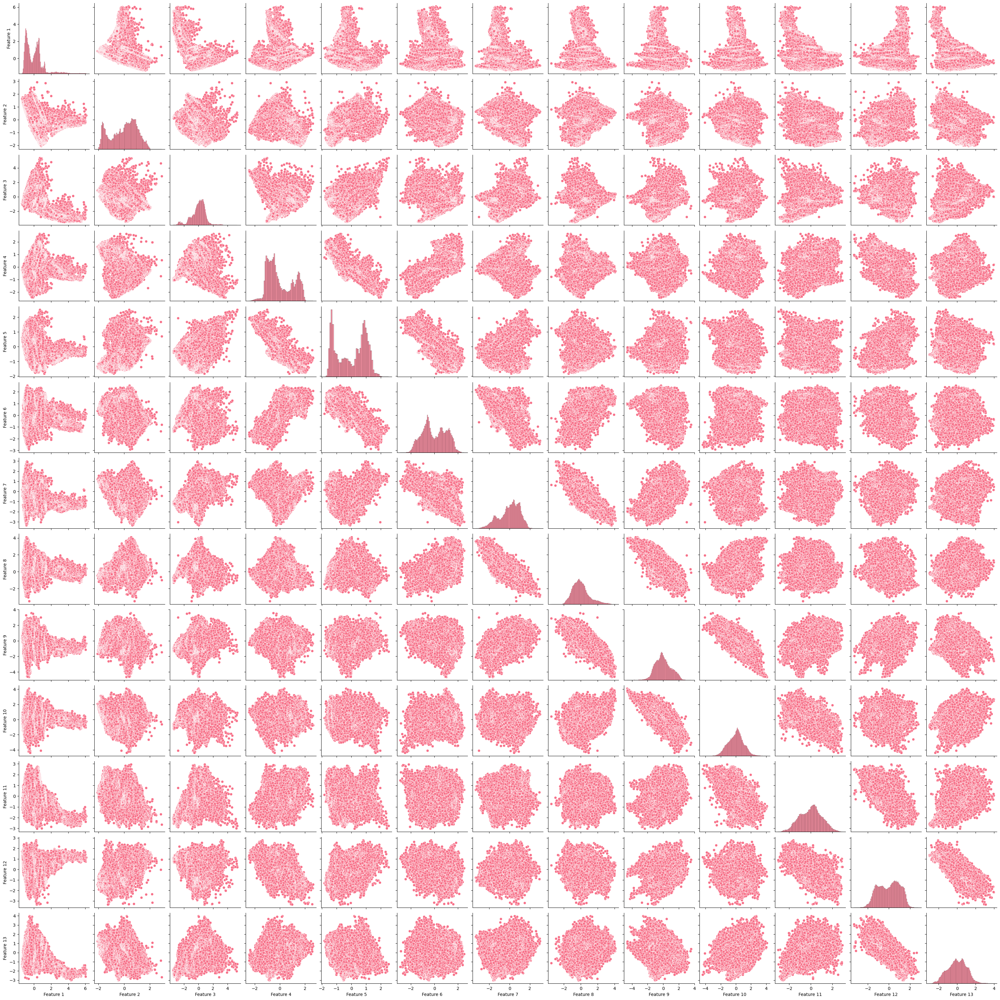

In [11]:
feature_df = pd.DataFrame(features_scaled, columns=[f"Feature {i+1}" for i in range(features_scaled.shape[1])])
# Plot pairplot in light purple theme
plt.figure(figsize=(15, 15))
sns.set_palette("husl")
sns.pairplot(feature_df.iloc[:, :13], )  # Adjust range to limit number of features
plt.show()

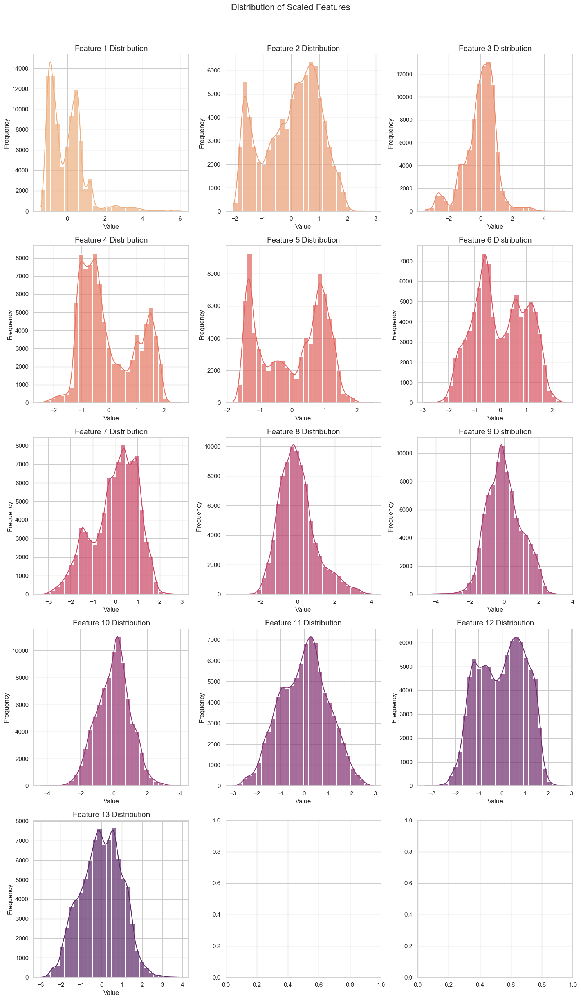

In [4]:

# Set the Seaborn style for better aesthetics
sns.set(style="whitegrid")

# Define the "flare" color palette
flare_palette = sns.color_palette("flare", as_cmap=True)

# Calculate the number of rows and columns needed for the subplots
num_features = features_scaled.shape[1]
num_cols = 3  # Define the number of columns in the grid
num_rows = (num_features // num_cols) + (num_features % num_cols > 0)  # Calculate rows needed

# Create a figure and axes for the subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, num_rows * 5))

# Set overall title for the entire plot above the subplots with distance between the title and subplots
plt.suptitle("Distribution of Scaled Features", fontsize=16, y=1.02)

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Loop over each feature (column) in the scaled feature matrix
for i in range(num_features):
    # Create a histogram for the current feature on the corresponding subplot
    sns.histplot(features_scaled[:, i], bins=30, kde=True, color=flare_palette(i / num_features), alpha=0.7, ax=axes[i])
    
    # Set plot title and axis labels for each subplot
    axes[i].set_title(f"Feature {i+1} Distribution", fontsize=14)
    axes[i].set_xlabel("Value", fontsize=12)
    axes[i].set_ylabel("Frequency", fontsize=12)

# Adjust layout to prevent overlapping subplots
plt.tight_layout()


# Display the plots
plt.show()

In [5]:
selected_features = features_scaled[:,[0,1,2,3]]

In [6]:
pca = PCA(n_components=2)
features_2d = pca.fit_transform(selected_features)

In [7]:
# Apply DBSCAN clustering
dbscan = DBSCAN(eps=0.1, min_samples=5)
dbscan.fit(selected_features)

DBSCAN(eps=0.1)

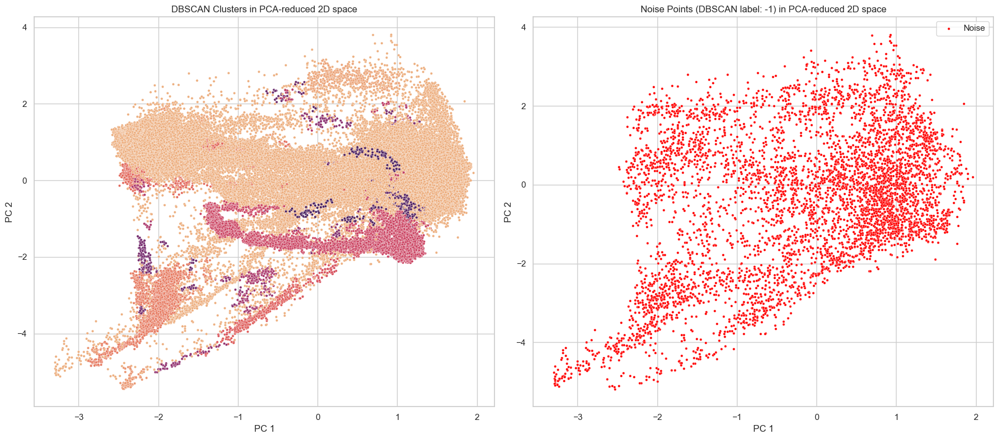

In [8]:
# Create a 1x2 grid of subplots (two columns, one row)
fig, axes = plt.subplots(1, 2, figsize=(18, 8))

# 1. Plotting DBSCAN Clusters in PCA-reduced 2D space (first subplot)
sns.scatterplot(x=features_2d[:, 0], y=features_2d[:, 1], hue=dbscan.labels_, palette="flare", s=10, legend='auto', ax=axes[0])

# Titles and labels for the first subplot
axes[0].set_title('DBSCAN Clusters in PCA-reduced 2D space')
axes[0].set_xlabel('PC 1')
axes[0].set_ylabel('PC 2')

# Remove legend to make space for colorbar
axes[0].legend([], [], frameon=False)

# 2. Filter the noise points (dbscan_labels == -1)
noise_points = dbscan.labels_ == -1
features_2d_noise = features_2d[noise_points]

# Plotting noise points in the second subplot
sns.scatterplot(x=features_2d_noise[:, 0], y=features_2d_noise[:, 1], color='red', label='Noise', s=10, ax=axes[1])

# Titles and labels for the second subplot
axes[1].set_title('Noise Points (DBSCAN label: -1) in PCA-reduced 2D space')
axes[1].set_xlabel('PC 1')
axes[1].set_ylabel('PC 2')

# Show the plot
plt.tight_layout()  # Adjust layout for better spacing
plt.show()


In [9]:
# Function to compute centroids for a clustering algorithm
def compute_centroids(features, labels):
    unique_labels = set(labels) - {-1}  # Exclude noise points (-1) if applicable
    centroids = {}
    for label in unique_labels:
        cluster_points = features[labels == label]
        centroid = cluster_points.mean(axis=0)
        centroids[label] = centroid
    return unique_labels,centroids



In [10]:

# Function to find representative samples for centroids
def find_representative_samples(features, centroids, audio_files):
    representative_samples = []
    for centroid in centroids.values(): # remove.values() if using kmeans
        distances = cdist([centroid], features)
        closest_idx = distances.argmin()
        representative_samples.append(audio_files[closest_idx])
    return representative_samples


In [11]:
# Listen to the representative samples for each algorithm
def listen_to_representative_samples(algorithm_name, representative_samples):
    print(f"\n--- {algorithm_name} Cluster Representative Samples ---")
    for i, audio_file in enumerate(representative_samples):
        print(f"Cluster {i} representative sample: {audio_file}")
        audio, sr = librosa.load(audio_file)
        ipd.display(ipd.Audio(audio, rate=sr))


In [12]:
dbscan_labels, dbscan_centroids = compute_centroids(selected_features, dbscan.labels_)


In [14]:
# Create a DataFrame from  scaled features with automatically generated column names
df = pd.DataFrame(selected_features, columns=[f'Feature{i+1}' for i in range(selected_features.shape[1])])

# Add cluster labels to the DataFrame
df['DBSCAN_Cluster'] = dbscan.labels_
# Ensure clustering columns are treated as strings or categorical
df['DBSCAN_Cluster'] = df['DBSCAN_Cluster'].astype(str)

In [15]:


# List of feature columns (excluding clustering columns)
feature_columns = df.columns[df.columns.str.contains('Feature')]


In [ ]:

# Pair plot for DBSCAN clusters
sns.pairplot(df, hue='DBSCAN_Cluster', vars=feature_columns)
plt.suptitle('Pairplot for DBSCAN Clusters', y=1.02)
plt.show()


In [17]:
kmeans = KMeans(n_clusters=5, random_state=42)
kmeans_labels = kmeans.fit_predict(selected_features)

In [18]:
def visualizations(features, cluster_labels, cluster_method, pca_features):
    """
    Create professional, research-worthy visualizations for clustering.
    
    Parameters:
        features: np.ndarray
            The dataset of shape (n_samples, n_features).
        cluster_labels: np.ndarray
            The cluster labels for each data point.
        cluster_method: str
            The clustering method used (e.g., KMeans, DBSCAN, Agglomerative).
        pca_features: np.ndarray
            PCA-transformed features for 2D visualization.
    """
    # Convert features to DataFrame for easier plotting
    feature_names = [f"Feature {i+1}" for i in range(features.shape[1])]
    df = pd.DataFrame(features, columns=feature_names)
    df['Cluster'] = cluster_labels

    # Subplots for distribution of features across clusters
    n_features = features.shape[1]
    n_cols = 2  # You can adjust this to a larger value if needed
    n_rows = (n_features // n_cols) + (1 if n_features % n_cols != 0 else 0)

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows))
    axes = axes.flatten()  # Flatten the axes array to easily index

    # Plot histograms of each feature with clusters as hue
    for i in range(n_features):
        ax = axes[i]
        sns.histplot(data=df, x=feature_names[i], hue='Cluster', multiple="stack", kde=True, ax=ax, bins=30)
        ax.set_title(f'{cluster_method}: {feature_names[i]} Distribution Across Clusters')

    # Remove unused subplots if there are more subplots than features
    for i in range(n_features, len(axes)):
        fig.delaxes(axes[i])

    plt.tight_layout()
    plt.show()

    # Plotting the clusters together in PCA-transformed space (2D)
    plt.figure(figsize=(10, 8))
    sns.scatterplot(x=pca_features[:, 0], y=pca_features[:, 1], hue=cluster_labels, palette="flare", s=10)
    plt.title(f'{cluster_method} - Clusters in PCA-reduced 2D space')
    plt.xlabel('PC 1')
    plt.ylabel('PC 2')
    plt.legend(title='Cluster')
    plt.show()

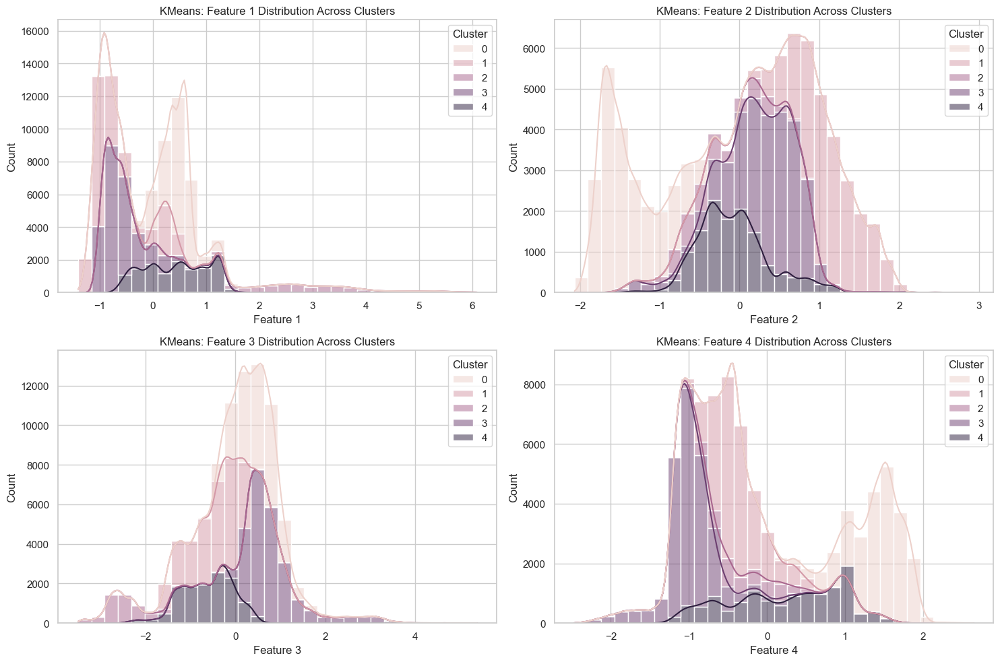

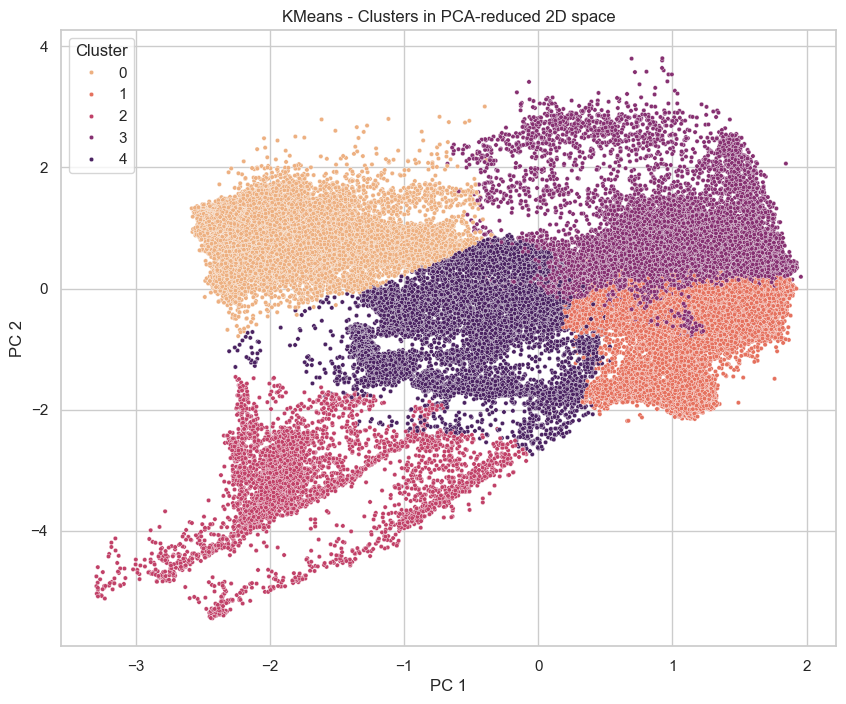

In [19]:
visualizations(selected_features, kmeans_labels, 'KMeans', features_2d)

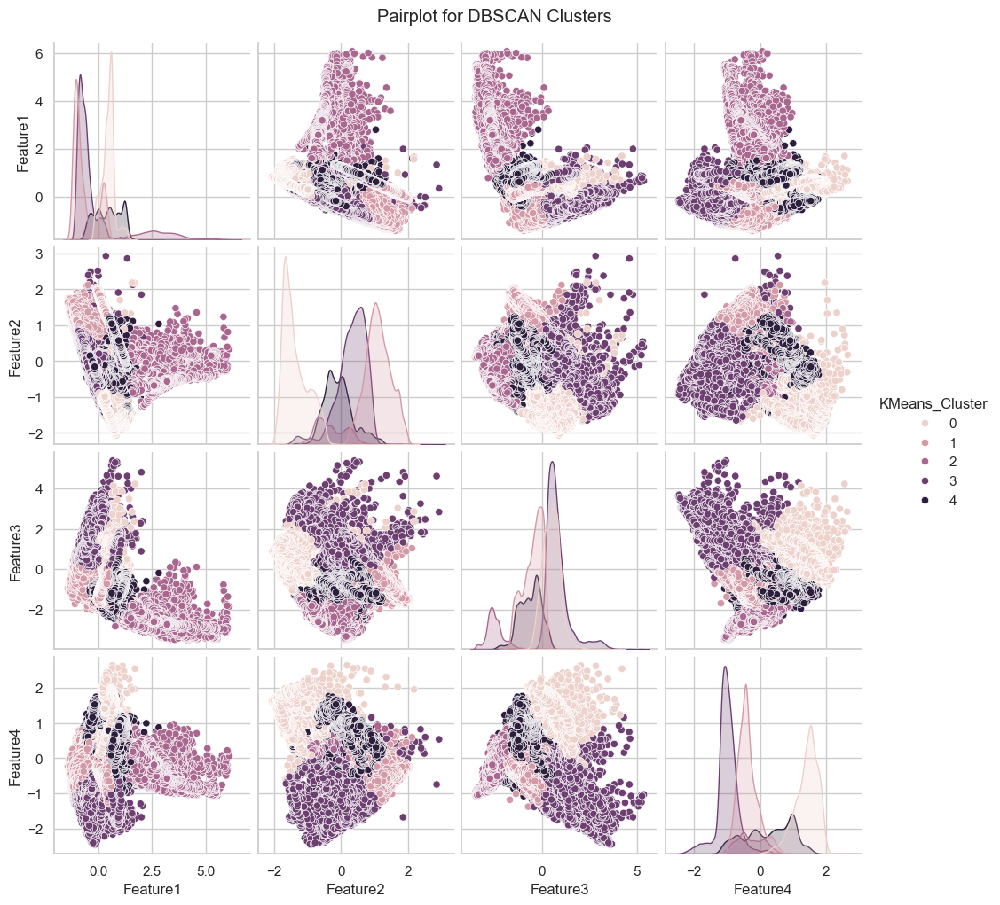

In [21]:
# Create a DataFrame from  scaled features with automatically generated column names
df_KMeans = pd.DataFrame(selected_features, columns=[f'Feature{i+1}' for i in range(selected_features.shape[1])])

# Add cluster labels to the DataFrame
df_KMeans['KMeans_Cluster'] = kmeans_labels
# Ensure clustering columns are treated as strings or categorical
df_KMeans['Kmeans_Cluster'] = df_KMeans['KMeans_Cluster'].astype(str)


# List of feature columns (excluding clustering columns)
feature_columns = df_KMeans.columns[df_KMeans.columns.str.contains('Feature')]
# Pair plot for DBSCAN clusters
sns.pairplot(df_KMeans, hue='KMeans_Cluster', vars=feature_columns)
plt.suptitle('Pairplot for DBSCAN Clusters', y=1.02)
plt.show()

In [12]:
#Compute centroids for DBSCAN and KMeans
kmeans_unique_labels, kmeans_centroids = compute_centroids(selected_features, kmeans_labels)

# Convert centroids to arrays for plotting
dbscan_centroids_array = np.array(list(dbscan_centroids.values()))
kmeans_centroids_array = np.array(list(kmeans_centroids.values()))


# Plotting DBSCAN centroids
plt.figure(figsize=(10, 8))
plt.scatter(
    dbscan_centroids_array[:, 0],
    dbscan_centroids_array[:, 1],
    color='pink',
    label='DBSCAN Centroids',
    s=10,
    marker='o'
)

plt.scatter(
    kmeans_centroids_array[:, 0],
    kmeans_centroids_array[:, 1],
    color='black',
    label='KMeans Centroids',
    s=30,
    marker='x'
)

plt.title('Centroids for DBSCAN and KMeans Clusters')
plt.xlabel('PC 1')
plt.ylabel('PC 2')

NameError: name 'compute_centroids' is not defined

In [71]:
labels = dbscan.labels_


In [86]:
agglo = AgglomerativeClustering(n_clusters=5, metric='cosine', linkage='average')  # Adjust n_clusters
agglo_labels = agglo.fit_predict(dbscan_centroids)

# Map agglomerative labels back to original DBSCAN labels
refined_labels = np.full_like(labels, fill_value=-1, dtype=int)  # Initialize all as noise  # Exclude noise (-1)

for i, cluster_label in enumerate(dbscan_labels):
    refined_labels[labels == cluster_label] = agglo_labels[i]

print("Refined Labels:", refined_labels)

Refined Labels: [-1  0  0 ...  1  1  1]


In [89]:
print(f"Original DBSCAN clusters: {len(dbscan_labels)}")
print(f"Refined clusters after meta-clustering: {len(np.unique(refined_labels[refined_labels >= 0]))}")

Original DBSCAN clusters: 173
Refined clusters after meta-clustering: 5


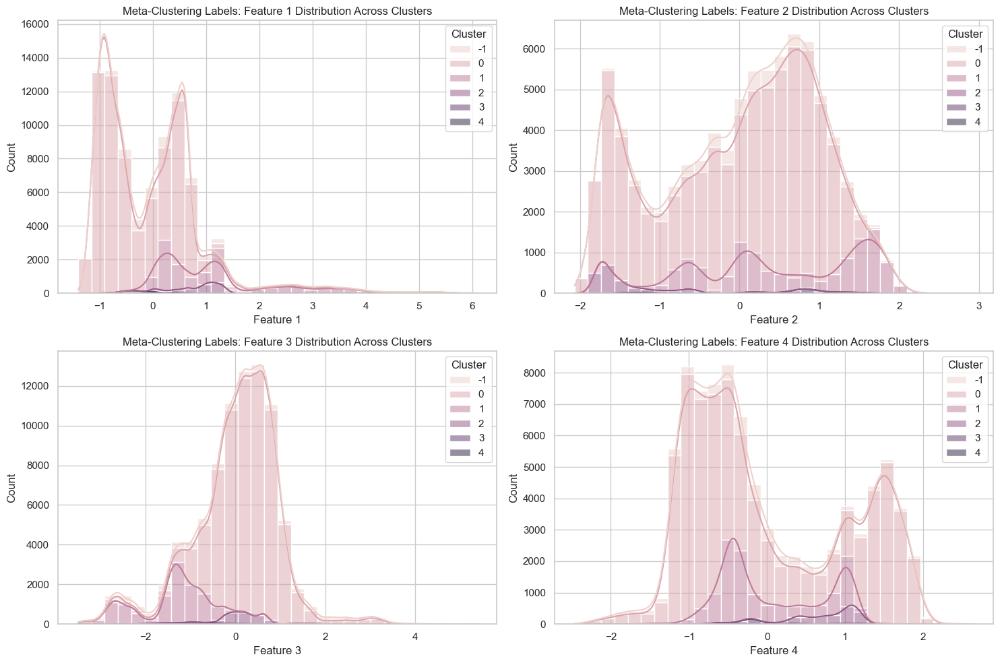

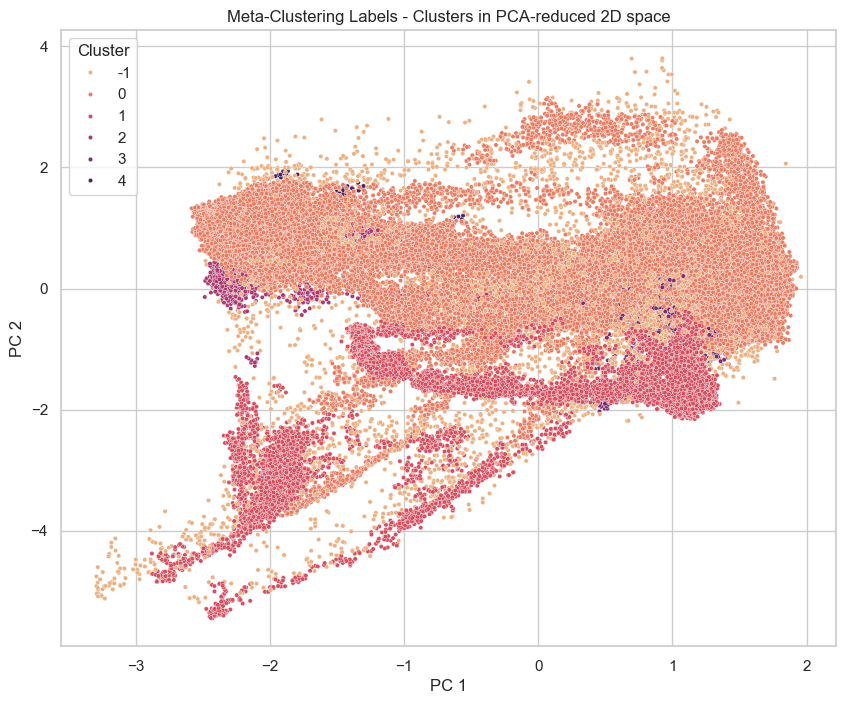

In [90]:
visualizations(selected_features, refined_labels, 'Meta-Clustering Labels', features_2d)

In [91]:
agglo_labels, agglo_centroids = compute_centroids(selected_features, refined_labels)
find_representative_samples(selected_features, agglo_centroids, audio_files)
listen_to_representative_samples('Agglomerative Clustering', find_representative_samples(selected_features, agglo_centroids, audio_files))


--- Agglomerative Clustering Cluster Representative Samples ---
Cluster 0 representative sample: C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181004_000000_segment_6110.wav


Cluster 1 representative sample: C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181004_000000_segment_1693.wav


Cluster 2 representative sample: C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_7876.wav


Cluster 3 representative sample: C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181001_000000_segment_4614.wav


Cluster 4 representative sample: C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180929_000000_segment_6570.wav


In [92]:
kmeans_labels, kmeans_centroids = compute_centroids(selected_features, kmeans_labels)
find_representative_samples(selected_features, kmeans_centroids, audio_files)
listen_to_representative_samples('KMeans', find_representative_samples(selected_features, kmeans_centroids, audio_files))


--- KMeans Cluster Representative Samples ---
Cluster 0 representative sample: C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181006_000000_segment_8444.wav


Cluster 1 representative sample: C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181001_000000_segment_5343.wav


Cluster 2 representative sample: C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180930_000000_segment_5439.wav


Cluster 3 representative sample: C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20181003_000000_segment_2425.wav


Cluster 4 representative sample: C:\Users\alina\Desktop\Capstone Project\segmented_audio\nn01a_20180929_000000_segment_522.wav
